# Radar BGT60TR13C Processing

This notebook is created to process data from the Infineon Radar GUI with the BGT60TR13C module.

important link for acquiasition<br>
<a href="https://softwaretools.infineon.com/tools/com.ifx.tb.tool.ifxradarsdk">RADAR SDK</a> <br>
<a href="https://softwaretools.infineon.com/tools/com.ifx.tb.tool.radarfusiongui">Radar Fusion GUI</a>


Radar Module : BGTXENSIV<sup>TM</sup> 60GHz radar sensor<br>
Infineon Radar GUI version: v3.6.5<br>
Radar SDK : v3.6.4<br>

Important Link : <br>
https://github.com/kopytjuk/python-fmcw/blob/master/RADAR.ipynb <br>


## Setup Dataset path(google drive)


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
folder_name='/content/drive/MyDrive/MyNotebook/dataradar_zhar/BGT60TR13C_record_napaszhar_220260106-151615'

In [4]:
!pip install /content/drive/MyDrive/MyNotebook/dataradar_zhar/radar_sdk/python_wheels/ifxradarsdk-3.6.4+4b4a6245-py3-none-linux_x86_64.whl

Processing ./drive/MyDrive/MyNotebook/dataradar_zhar/radar_sdk/python_wheels/ifxradarsdk-3.6.4+4b4a6245-py3-none-linux_x86_64.whl
ifxradarsdk is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.


## Data Extract


In [6]:
import json
import numpy as np
import pandas as pd
# 1. Nama file JSON
conf_file = folder_name + "/RadarIfxAvian_00/config.json"
meta_radar_file = folder_name + "/RadarIfxAvian_00/meta.json"
radar_file = folder_name +  "/RadarIfxAvian_00/radar.npy"
meta_file = folder_name + "/meta.json"

with open(conf_file, "r") as file:
    conf_data = json.load(file)

with open(meta_file, "r") as file:
    meta_data = json.load(file)

with open(meta_radar_file, "r") as file:
    meta_radar_data = json.load(file)


# Ambil bagian dalam dari json
config_json = conf_data["device_config"]["fmcw_single_shape"]

# # Visualize data
print("=== Konfigurasi FMCW Device ===\n")
for key, value in config_json.items():
    print(f"{key}: {value}")
print("=== Metadata ===\n")
for key, value in meta_data.items():
    print(f"{key}: {value}")
print("=== Meta radar data ===\n")
for key, value in meta_radar_data.items():
    print(f"{key}: {value}")



# Load file npy
data = np.load(radar_file)

# # Konversi ke nested list (Python native)
# nested_list = data.tolist()  # sangat penting, karena JSON hanya bisa serialisasi list, bukan np.ndarray

# # Simpan ke file JSON
# with open("radar_data_4d.json", "w") as f:
#     json.dump(nested_list, f, indent=2)

# print("✅ Data berhasil disimpan dalam format JSON 4D: radar_data_4d.json")


num_frames, num_rx, num_chirps, num_samples = data.shape

# Flatten chirp-sample untuk setiap RX dan frame
data_flat = data.reshape(num_frames, num_rx, -1)

# Buat nama kolom: "chirp_sample", contoh: "0_0", "0_1", ..., "63_61"
column_names = []
for chirp_idx in range(num_chirps):
    for sample_idx in range(num_samples):
        column_names.append(f"{chirp_idx}_{sample_idx}")

# Tambahkan kolom "frame" dan "rx" di depan
column_names = ["frame", "rx"] + column_names

# Susun data
records = []
for f in range(num_frames):
    for r in range(num_rx):
        row = data_flat[f, r]
        records.append([f, r] + row.tolist())

# Buat DataFrame
df = pd.DataFrame(records, columns=column_names)

# Tampilkan contoh
print(df.head())

=== Konfigurasi FMCW Device ===

aaf_cutoff_Hz: 500000
chirp_repetition_time_s: 0.0005911249900236726
end_frequency_Hz: 63500000000
frame_repetition_time_s: 0.07726884633302689
hp_cutoff_Hz: 80000
if_gain_dB: 23
mimo_mode: off
num_chirps_per_frame: 8
num_samples_per_chirp: 64
rx_antennas: [1, 2, 3]
sample_rate_Hz: 2000000
start_frequency_Hz: 58000000000
tx_antennas: [1]
tx_power_level: 31
=== Metadata ===

date_captured: 2026-01-06T15:16:15+0800
hostname: unknown
ifxdaq_version: 1.0.0
machine: AMD64
os: Windows
os_version: 
username: 
=== Meta radar data ===

adc_resolution: 12
description: BGT60TR13C FMCW Radar Sensor
firmware_version: 2.6.0
sdk_version: 3.6.4+4b4a624
uuid: 0
   frame  rx   0_0   0_1   0_2   0_3   0_4   0_5   0_6   0_7  ...  7_54  7_55  \
0      0   0  1908  1770  1648  1566  1540  1525  1468  1392  ...  2060  2118   
1      0   1  2246  2334  2340  2331  2340  2340  2312  2288  ...  1868  1870   
2      0   2  2151  2166  2096  2046  2103  2204  2218  2144  ...  2033

Data -> 1 Frame -> 3 Antenna -> 8 Chirps -> 64 Samples

In [7]:
data.shape

(256, 3, 8, 64)

In [8]:
data_flat.shape

(256, 3, 512)

Data Samples dari sebuah Chirp

In [9]:
print(data[0][2][7]) ## data[*frame*][*antenna Rx*][*Chirps*]

[2152 2162 2094 2044 2104 2206 2218 2138 2094 2132 2201 2220 2182 2130
 2120 2156 2203 2204 2136 2088 2120 2170 2166 2109 2058 2056 2090 2088
 2055 2022 1994 1996 2016 2014 1992 1968 1962 1976 1996 1992 1984 1974
 1964 1978 2008 2016 1988 1957 1969 2020 2040 2002 1970 1987 2033 2062
 2050 2025 2026 2056 2094 2106 2068 2030]


Tampilkan data dari sebuah Chirps <br>
Data frameke

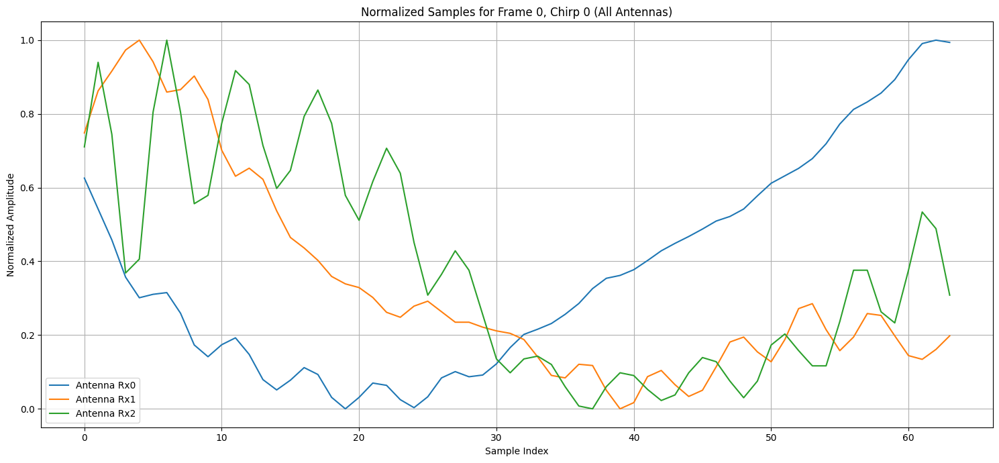

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'data' is already loaded and has shape (num_frames, num_rx, num_chirps, num_samples)
# For this example, we'll use Frame 0 and Chirp 0 for all antennas

num_rx_antennas = data.shape[1] # Get the number of Rx antennas from the data shape

plt.figure(figsize=(15, 7))

for rx_index in range(num_rx_antennas):
    # Select data for the current Rx antenna
    samples_to_plot = data[50, rx_index, 0, :] # frame ke 50,dr semua antenna, dan chirp ke-0

    # Normalize the samples using min-max scaling
    min_val = np.min(samples_to_plot)
    max_val = np.max(samples_to_plot)
    normalized_samples = (samples_to_plot - min_val) / (max_val - min_val)

    # Plot on the same axes
    plt.plot(normalized_samples, label=f'Antenna Rx{rx_index}')

plt.title('Normalized Samples for Frame 0, Chirp 0 (All Antennas)')
plt.xlabel('Sample Index')
plt.ylabel('Normalized Amplitude')
plt.grid(True)
plt.legend() # Show legend to distinguish antennas
plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show()

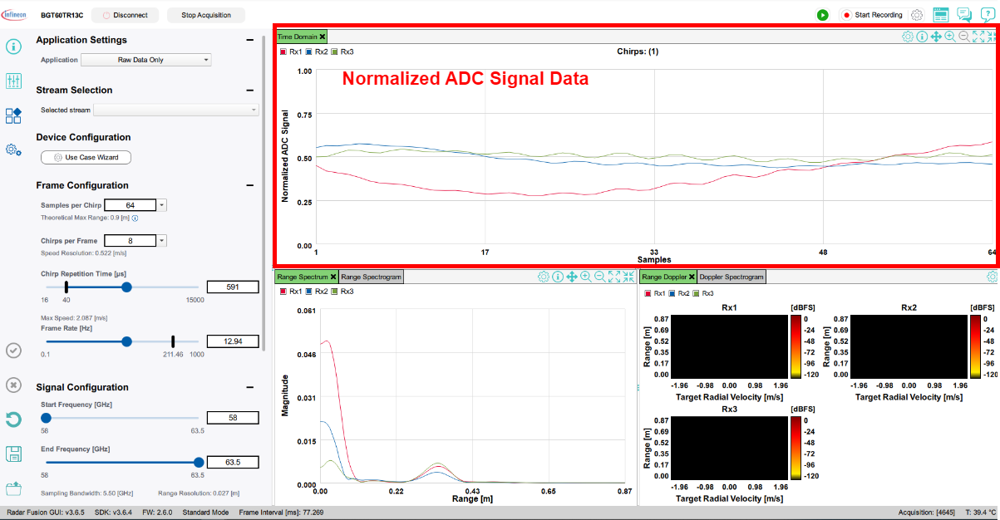

## Data Processing

Develop Function

In [11]:
# ===========================================================================
# Copyright (C) 2021 Infineon Technologies AG
#
# Redistribution and use in source and binary forms, with or without
# modification, are permitted provided that the following conditions are met:
#
# 1. Redistributions of source code must retain the above copyright notice,
#    this list of conditions and the following disclaimer.
# 2. Redistributions in binary form must reproduce the above copyright
#    notice, this list of conditions and the following disclaimer in the
#    documentation and/or other materials provided with the distribution.
# 3. Neither the name of the copyright holder nor the names of its
#    contributors may be used to endorse or promote products derived from
#    this software without specific prior written permission.
#
# THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS "AS IS"
# AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE
# IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE
# ARE DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER OR CONTRIBUTORS BE
# LIABLE FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR
# CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF
# SUBSTITUTE GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS
# INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF LIABILITY, WHETHER IN
# CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE)
# ARISING IN ANY WAY OUT OF THE USE OF THIS SOFTWARE, EVEN IF ADVISED OF THE
# POSSIBILITY OF SUCH DAMAGE.
# ===========================================================================

import numpy as np


def fft_spectrum(mat, range_window):
    # Calculate fft spectrum
    # mat:          chirp data
    # range_window: window applied on input data before fft

    # received data 'mat' is in matrix form for a single receive antenna
    # each row contains 'num_samples' for a single chirp
    # total number of rows = 'num_chirps'

    # -------------------------------------------------
    # Step 1 - remove DC bias from samples
    # -------------------------------------------------
    [num_chirps, num_samples] = np.shape(mat)

    # helpful in zero padding for high resolution FFT.
    # compute row (chirp) averages
    avgs = np.average(mat, 1).reshape(num_chirps, 1)

    # de-bias values
    mat = mat - avgs
    # -------------------------------------------------
    # Step 2 - Windowing the Data
    # -------------------------------------------------
    mat = np.multiply(mat, range_window)

    # -------------------------------------------------
    # Step 3 - add zero padding here
    # -------------------------------------------------
    zp1 = np.pad(mat, ((0, 0), (0, num_samples)), 'constant')

    # -------------------------------------------------
    # Step 4 - Compute FFT for distance information
    # -------------------------------------------------
    range_fft = np.fft.fft(zp1) / num_samples

    # ignore the redundant info in negative spectrum
    # compensate energy by doubling magnitude
    range_fft = 2 * range_fft[:, range(int(num_samples))]

    return range_fft


In [20]:
# ===========================================================================
# Copyright (C) 2021-2022 Infineon Technologies AG
#
# Redistribution and use in source and binary forms, with or without
# modification, are permitted provided that the following conditions are met:
#
# 1. Redistributions of source code must retain the above copyright notice,
#    this list of conditions and the following disclaimer.
# 2. Redistributions in binary form must reproduce the above copyright
#    notice, this list of conditions and the following disclaimer in the
#    documentation and/or other materials provided with the distribution.
# 3. Neither the name of the copyright holder nor the names of its
#    contributors may be used to endorse or promote products derived from
#    this software without specific prior written permission.
#
# THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS "AS IS"
# AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE
# IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE
# ARE DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER OR CONTRIBUTORS BE
# LIABLE FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR
# CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF
# SUBSTITUTE GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS
# INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF LIABILITY, WHETHER IN
# CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE)
# ARISING IN ANY WAY OUT OF THE USE OF THIS SOFTWARE, EVEN IF ADVISED OF THE
# POSSIBILITY OF SUCH DAMAGE.
# ===========================================================================

import numpy as np
from scipy import signal, constants

# from helpers.fft_spectrum import *


class DistanceAlgo_2:
    """Algorithm for computation of distance FFT from raw data"""

    def __init__(self, device, num_chirps_per_frame: int):
        self.num_chirps_per_frame = num_chirps_per_frame
        # self.num_chirps_per_frame = device_config["num_chirps_per_frame"]

        # compute Blackman-Harris Window matrix over chirp samples(range)
        # self.range_window = signal.blackmanharris(chirp.num_samples).reshape(1, chirp.num_samples)
        self.range_window = signal.blackmanharris(device["num_samples_per_chirp"]).reshape(1, device["num_samples_per_chirp"])

        # bandwidth_hz = abs(chirp.end_frequency_Hz - chirp.start_frequency_Hz)
        # fft_size = chirp.num_samples * 2
        # self.range_bin_length = constants.c / (2 * bandwidth_hz * fft_size / chirp.num_samples)
        bandwidth_hz = abs(device["end_frequency_Hz"] - device["start_frequency_Hz"])
        fft_size = device["num_samples_per_chirp"] * 2
        self.range_bin_length = constants.c / (2 * bandwidth_hz * fft_size / device["num_samples_per_chirp"])

    def compute_distance(self, chirp_data):
        # Computes distance using chirp data
        # chirp_data: single antenna chirp data

        # Step 1 - calculate range fft spectrum of the frame
        range_fft = fft_spectrum(chirp_data, self.range_window)

        # Step 2 - convert to absolute spectrum
        range_fft_abs = abs(range_fft)

        # Step 3 - coherent integration of all chirps
        distance_data = np.divide(range_fft_abs.sum(axis=0), self.num_chirps_per_frame)

        # Step 4 - peak search and distance calculation
        skip = 8
        distance_peak = np.argmax(distance_data[skip:])

        distance_peak_m = self.range_bin_length * (distance_peak + skip)
        return distance_peak_m, distance_data


In [21]:
algo = DistanceAlgo_2(config_json,config_json["num_chirps_per_frame"])
# len_frame = antenna1_sample.shape[0]
len_frame = data.shape[0]

print("Length of Frames : "+str(len_frame))
i_ant = 0
distance_samples = np.zeros(data.shape)
distance_list = algo.range_bin_length * np.arange(0,config_json["num_samples_per_chirp"])
distance_list.shape

for frame_number in range(len_frame):
    frame_contents = data[frame_number,:,:,:]
    # frame_data = frame_contents[0]
    antenna_samples = frame_contents[i_ant, :, :]
    distance_peak_m, distance_data = algo.compute_distance(antenna_samples)
    distance_samples[frame_number,i_ant,0] = distance_data

    # print("Distance:" + format(distance_peak_m, "^05.3f") + "m")

Length of Frames : 256


/tmp/ipython-input-3974211140.py:44: DeprecationWarning: Importing blackmanharris from 'scipy.signal' is deprecated since SciPy 1.1.0 and will raise an error in SciPy 1.13.0. Please use 'scipy.signal.windows.blackmanharris' or the convenience function 'scipy.signal.get_window' instead.
  self.range_window = signal.blackmanharris(device["num_samples_per_chirp"]).reshape(1, device["num_samples_per_chirp"])


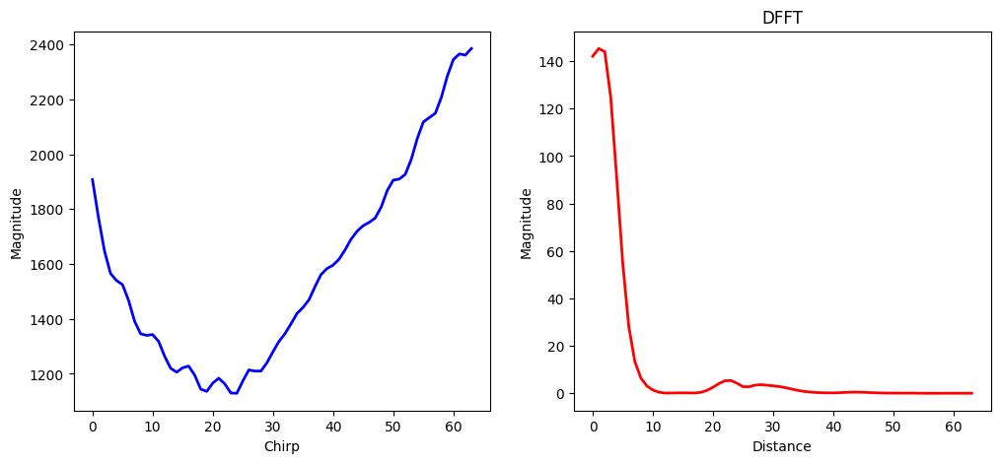

In [53]:
%matplotlib inline

import numpy as np
from matplotlib import pyplot
pyplot.rcParams['figure.dpi'] = 100
pyplot.rcParams['savefig.dpi'] = 100

import matplotlib.pyplot as plt
#import seaborn as sns

# x1 = np.arange(0,config_json["num_samples_per_chirp"])
# x2 = distance_list
# y1 = data[0,i_ant,0,:]
# y2 = distance_samples[0,i_ant,0,:]

x1 = np.arange(0,config_json["num_samples_per_chirp"])
x2 = np.arange(0,config_json["num_samples_per_chirp"])
y1 = data[0,i_ant,0,:]
y2 = distance_samples[0,i_ant,0,:]

# plt.rcParams['figure.format'] = 'svg'

# Create a figure and axes.
fig = plt.figure(figsize=(12,5),)
ax1 = plt.subplot(1,2,1)
ax2 = plt.subplot(1,2,2)

# Set up the subplots
# ax1.set_xlim((0,2))
# ax1.set_ylim((-2,2))
ax1.set_xlabel('Chirp')
ax1.set_ylabel('Magnitude')

# ax2.set_xlim((-2,2))
# ax2.set_ylim((-2,2))
ax2.set_xlabel('Distance')
ax2.set_ylabel('Magnitude')
ax2.set_title('DFFT')

# Create objects that will change in the animiation.
# These objects are initially empty, and will be given new values for each frame in the animation.
txt_title = ax1.set_title('')
line1, = ax1.plot(x1, y1, 'b', lw=2)  # ax.plot returns a list of 2D line objects.
line2, = ax2.plot(x2, y2, 'r', lw=2)
# pt1, = ax2.plot([], [], 'g.', ms=20)
# line3, = ax2.plot([], [], 'y', lw=2)
# x1 = np.arange(0,data_sample_config["device_config"]["fmcw_single_shape"]["num_samples_per_chirp"])
# x2 = distance_list
# for n in range(len_frame):

#     y1 = data_sample[n,i_ant,0,:]
#     y2 = distance_samples[n,i_ant,0,:]

#     line1, = ax1.plot(x1, y1, 'b', lw=2)  # ax.plot returns a list of 2D line objects.
#     line2, = ax2.plot(x2, y2, 'r', lw=2)
#     plt.show()
# ax1.legend(['Chirp', 'cos']);

Animasikan DFFT Nya

In [54]:
# Animation function. This function is called sequentially.
def drawframe(n):
    # x = np.linspace(0, 2, 1000)
    # y1 = np.sin(2 * np.pi * (x - 0.01 * n))
    # y2 = np.cos(2 * np.pi * (x - 0.01 * n))

    # x1 = np.arange(0,config_json["num_samples_per_chirp"])
    # x2 = distance_list
    # y1 = data[n,i_ant,0,:]
    # y2 = distance_samples[n,i_ant,0,:]

    x1 = np.arange(0,config_json["num_samples_per_chirp"])
    x2 = np.arange(0,config_json["num_samples_per_chirp"])
    y1 = data[n,i_ant,0,:]
    y2 = distance_samples[n,i_ant,0,:]


    line1.set_data(x1, y1)
    line2.set_data(x2, y2)
    # line3.set_data(y1[0:50],y2[0:50])
    # pt1.set_data([y1[0]], [y2[0]])   # Note that matplotlib will throw an error if we supply only numbers (i.e., pt1.set_data(y1[0],y2[0]))
    txt_title.set_text('Frame = {0:4d}'.format(n))
    return (line1,line2)
# Initialization function.
def init():
    line1.set_data([],[])
    line2.set_data([],[])
    return(line1, line2)

from matplotlib import animation

#anim = animation.FuncAnimation(fig, drawframe, init_func=init, frames=100, interval=20, blit=True)
# anim = animation.FuncAnimation(fig, drawframe, frames=round(len_frame/10), interval=1, blit=True)
anim = animation.FuncAnimation(fig, drawframe, frames=round(len_frame), interval=0.01, blit=True)
# blit = True re-draws only the parts that have changed.

import matplotlib
# anim.save(filename="pillow_example.gif", writer="pillow")
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [55]:
from IPython.display import HTML
HTML(anim.to_jshtml())

Fokus pada index ke 20-40

In [63]:
import numpy as np

peak_values_per_frame = []
peak_indices_per_frame = []

start_index = 20
end_index = 40

for frame_num in range(len_frame):
    # Select the relevant part of distance_samples for the current frame and antenna
    frame_data_slice = distance_samples[frame_num, i_ant, 0, start_index:end_index]

    # Find the peak value and its relative index within the slice
    current_peak_value = np.max(frame_data_slice)
    current_peak_relative_index = np.argmax(frame_data_slice)

    # Convert relative index to absolute index in the original distance_samples
    current_peak_absolute_index = start_index + current_peak_relative_index

    peak_values_per_frame.append(current_peak_value)
    peak_indices_per_frame.append(current_peak_absolute_index)

    print(f"Frame {frame_num}: Peak Value (indices {start_index}-{end_index-1}) = {current_peak_value:.2f} at Index {current_peak_absolute_index}")

# Optionally, you can also store these in a DataFrame or plot them if needed.
# print("\nAll Peak Values:", peak_values_per_frame)
# print("All Peak Indices:", peak_indices_per_frame)

Frame 0: Peak Value (indices 20-39) = 5.42 at Index 23
Frame 1: Peak Value (indices 20-39) = 4.90 at Index 22
Frame 2: Peak Value (indices 20-39) = 4.29 at Index 22
Frame 3: Peak Value (indices 20-39) = 3.95 at Index 27
Frame 4: Peak Value (indices 20-39) = 5.24 at Index 26
Frame 5: Peak Value (indices 20-39) = 5.21 at Index 26
Frame 6: Peak Value (indices 20-39) = 5.75 at Index 26
Frame 7: Peak Value (indices 20-39) = 6.40 at Index 26
Frame 8: Peak Value (indices 20-39) = 7.36 at Index 25
Frame 9: Peak Value (indices 20-39) = 8.77 at Index 25
Frame 10: Peak Value (indices 20-39) = 8.98 at Index 25
Frame 11: Peak Value (indices 20-39) = 9.13 at Index 25
Frame 12: Peak Value (indices 20-39) = 9.85 at Index 25
Frame 13: Peak Value (indices 20-39) = 9.99 at Index 25
Frame 14: Peak Value (indices 20-39) = 9.26 at Index 25
Frame 15: Peak Value (indices 20-39) = 10.08 at Index 25
Frame 16: Peak Value (indices 20-39) = 10.89 at Index 25
Frame 17: Peak Value (indices 20-39) = 9.82 at Index 25


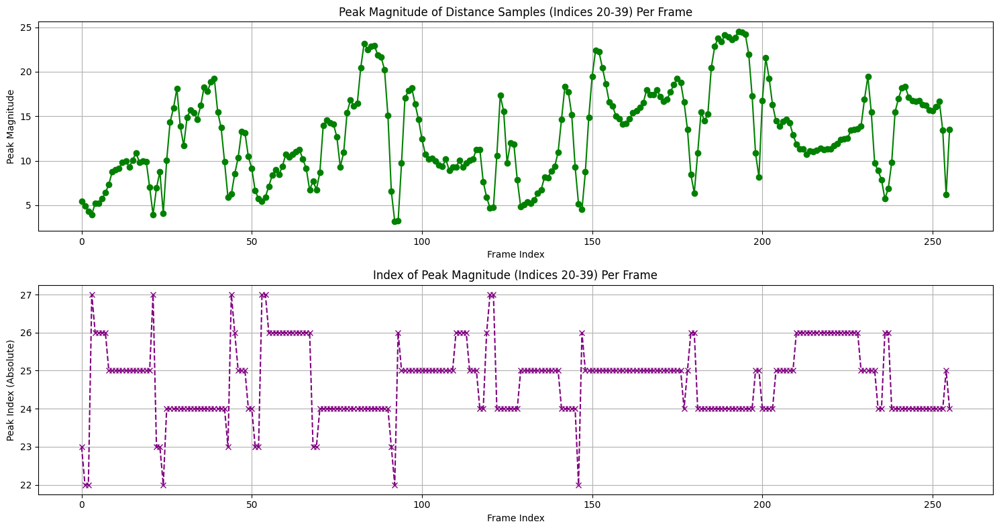

In [64]:
import matplotlib.pyplot as plt

# Create an array of frame indices for the x-axis
frame_indices = np.arange(len_frame)

plt.figure(figsize=(15, 8))

# Subplot for Peak Values
plt.subplot(2, 1, 1) # 2 rows, 1 column, first plot
plt.plot(frame_indices, peak_values_per_frame, marker='o', linestyle='-', color='green')
plt.title('Peak Magnitude of Distance Samples (Indices 20-39) Per Frame')
plt.xlabel('Frame Index')
plt.ylabel('Peak Magnitude')
plt.grid(True)

# Subplot for Peak Indices
plt.subplot(2, 1, 2) # 2 rows, 1 column, second plot
plt.plot(frame_indices, peak_indices_per_frame, marker='x', linestyle='--', color='purple')
plt.title('Index of Peak Magnitude (Indices 20-39) Per Frame')
plt.xlabel('Frame Index')
plt.ylabel('Peak Index (Absolute)')
plt.grid(True)

plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show()